In [1]:
import os
import pandas as pd
import sqlalchemy as sql
import numpy as np
import scipy as sci
import matplotlib.pyplot as plt
import scipy.optimize as sco

# https://pypi.org/project/yfinance/
import yfinance as yf

import hvplot.pandas
import holoviews as hv
import seaborn as sns
import copy


from pathlib import Path

# https://pandas-datareader.readthedocs.io/en/latest/
from pandas_datareader import data as pdr
from pandas import Timestamp as tstamp
from pandas import read_csv as rcsv
from pandas import read_sql_query as rsqq
from sqlalchemy import (
    create_engine as ce,
    inspect
)

# Import date and timedelta class
from datetime import date
from datetime import timedelta
from scipy import stats

from MCForecastTools import MCSimulation
from calculations import MPTCalculations as mpt
from metrics import QuantMetrics as qm
from dataset import DataCollection as ds

import warnings
warnings.filterwarnings('ignore')

print(f"Package imports and dependencies resolved")

Package imports and dependencies resolved


### Portfolio Analysis and Optimization with Post-Modern Portfolio Theory (PMPT)

---
Steps Involved:
1. Project Settings
2. Data Preparation (Data Collection, Clean and Format)
3. Quantitative Analysis
4. Visualizations

### 1. Project Settings
- Define the time delta (time-frame) to start with in the historical time reference.

In [2]:
# Specifiy date range for data
# Set start and end dates of 5 years "5Y" back from your current date
# Define the time delta (time-frame) to start with
time_delta = 7

end_date = pd.to_datetime('today')
# 5 years
start_date = end_date - np.timedelta64(time_delta, 'Y')
start, end = start_date, end_date
# Verify date range
print(f"Start date: {start} and End date: {end}")

Start date: 2015-10-21 21:23:47.556999 and End date: 2022-10-21 14:08:11.556999


### Add or remove stocks of possible sectors
- tech_list or others to evaluate the asset performance
- refer to dataset.py for the entire sector list

In [3]:
# Specify portfolio sectors - basket of market index and assets - S&P 500 Index (^GSPC) and Tech Stocks List
basket_list = ds.market + ds.blend_list

print("Basket of stocks")
print(basket_list)

Basket of stocks
['^GSPC', 'IBM', 'TSLA', 'TSM', 'NVDA', 'DVN', 'OXY', 'CNI', 'NOC', 'BHF', 'AIG']


### 2. Data Preparation

In [4]:
# Dataframe closing prices of basket, i.e. market index and assets
# Fetch data from Yahoo Finance API
stock_data, raw_data = ds.get_raw_data(basket_list, start, end)
stock_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)
stock_data = stock_data.reset_index()
raw_data.rename(columns = {'^GSPC':'SP500_index'}, inplace = True)

#### Raw Data dataframe

In [5]:
# Output raw data is raw_frame_close
display(raw_data.shape)
# Review random 5 rows from dataframe
display(raw_data.sample(5))

(1763, 66)

Attributes    Adj Close                                                  \
Symbols     SP500_index         IBM        TSLA         TSM        NVDA   
Date                                                                      
2020-07-27  3239.409912  107.762390  102.639999   79.915283  103.991554   
2021-08-17  4448.080078  129.541260  221.903336  108.482559  194.389877   
2020-08-31  3500.310059  106.664833  166.106674   76.075516  133.458237   
2019-06-27  2924.919922  112.824165   14.856000   36.843105   40.606903   
2021-06-24  4266.490234  130.782501  226.606674  114.467598  191.867325   

Attributes                                                           ...  \
Symbols           DVN        OXY         CNI         NOC        BHF  ...   
Date                                                                 ...   
2020-07-27   8.919080  16.547230   95.977470  296.619720  28.850000  ...   
2021-08-17  24.542295  23.911802  105.418610  361.390503  47.169998  ...   
2020-08-31   9.492624  12.623456  103.627136  331.305969  30.360001  ...   
2019-06-27  23.549164  46.035049   89.029037  301.871246  35.029999  ...   
2021-06-24  27.123295  31.518297  105.448471  362.419830  44.730000  ...   

Attributes     Volume                                                  \
Symbols           IBM         TSLA         TSM        NVDA        DVN   
Date                                                                    
2020-07-27  3905136.0  240730500.0  39899200.0  29213200.0  7119200.0   
2021-08-17  3215195.0   71163900.0  13398800.0  20458500.0  8292500.0   
2020-08-31  5049983.0  355123200.0   9812900.0  50084000.0  5002400.0   
2019-06-27  2248691.0   95095500.0  11375200.0  44544000.0  4934200.0   
2021-06-24  3775746.0  137947200.0   6772200.0  32092400.0  9092900.0   

Attributes                                                         
Symbols            OXY        CNI       NOC        BHF        AIG  
Date                                                               
2020-07-27  13963300.0   953700.0  575800.0   395000.0  5143600.0  
2021-08-17  15987800.0  1932200.0  924700.0   476200.0  4490900.0  
2020-08-31  17913800.0   984700.0  558000.0   932500.0  7539800.0  
2019-06-27   5387200.0   353300.0  640900.0  1529200.0  3878300.0  
2021-06-24  15182200.0   924100.0  644900.0   517500.0  2818000.0  

[5 rows x 66 columns]

#### Cleaned Stock Data dataframe - close prices

In [6]:
# Output cleaned data to 'Close' prices is stock_data, cut table down to 29 columns from 174 columns
display(stock_data.shape)
print("Review random 5 rows from dataframe")
# Review random 5 rows from dataframe
display(stock_data.sample(5))

(1763, 12)

Review random 5 rows from dataframe


Symbols,Date,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
1161,2020-06-04,3112.350098,123.221794,57.625332,54.279999,87.665001,12.720000,15.550000,89.050003,335.739990,33.740002,35.209999
604,2018-03-19,2712.919922,150.430206,20.903999,44.599998,60.250000,31.160000,63.650002,72.739998,344.929993,53.200001,54.450001
562,2018-01-17,2802.560059,161.233276,23.143999,43.130001,56.180000,43.439999,75.860001,80.430000,317.510010,64.360001,61.419998
753,2018-10-18,2768.780029,124.808792,17.594000,38.540001,59.882500,35.099998,71.900002,83.360001,308.200012,41.700001,48.610001
1247,2020-10-06,3360.969971,116.606117,137.993332,83.120003,137.365005,9.730000,10.130000,107.620003,308.970001,29.790001,28.980000


#### Confirm and review raw data storage in csv file

In [7]:
# Import the [~offline stored] data from the csv file
# Generate dataframe setting the DatetimeIndex with 'date' as as index. 
working_raw_data = rcsv(
    Path('data/raw_frame_close.csv'),
    index_col=0,
    parse_dates=True,
    infer_datetime_format=True,
    header = [0,1]
)

# Output dataframe name is working_raw_frame_close
print('Sample row of DataFrame from local csv data source path:')
display(working_raw_data.shape)

# Display sample 5 rows of dataframe
display(working_raw_data.sample(5))

Sample row of DataFrame from local csv data source path:


(1763, 66)

Attributes    Adj Close                                                  \
Symbols           ^GSPC         IBM        TSLA         TSM        NVDA   
Date                                                                      
2020-02-05  3334.689941  130.352264   48.980000   54.668678   62.489677   
2017-01-30  2280.899902  128.828033   16.708668   26.264238   27.128756   
2016-09-01  2170.860107  115.861412   13.384667   24.386415   15.548265   
2020-09-09  3398.959961  105.756554  122.093330   76.219505  126.915329   
2021-10-25  4566.479980  116.097778  341.619995  111.408447  231.474472   

Attributes                                                           ...  \
Symbols           DVN        OXY         CNI         NOC        BHF  ...   
Date                                                                 ...   
2020-02-05  19.625956  40.483929   93.675934  351.407043  42.540001  ...   
2017-01-30  36.705406  55.796555   65.327835  209.425751        NaN  ...   
2016-09-01  35.495914  61.871037   60.031254  192.621246        NaN  ...   
2020-09-09   8.366086  10.968732  103.240685  328.211578  30.415001  ...   
2021-10-25  37.732361  34.988033  132.850342  400.348175  52.400002  ...   

Attributes      Volume                                                 \
Symbols            IBM         TSLA        TSM        NVDA        DVN   
Date                                                                    
2020-02-05  15048593.0  726357000.0  6594400.0  20822000.0  6787400.0   
2017-01-30   4283161.0   57016500.0  7253100.0  49600400.0  4126000.0   
2016-09-01   2466886.0  119146500.0  6066600.0  42849200.0  6026800.0   
2020-09-09   3944152.0  238397400.0  7867500.0  73620000.0  7062100.0   
2021-10-25   6667204.0  188556300.0  6667700.0  23023500.0  8639500.0   

Attributes                                                         
Symbols            OXY        CNI        NOC       BHF        AIG  
Date                                                               
2020-02-05   8613200.0   857300.0   815200.0  863300.0  4408400.0  
2017-01-30   4551000.0   980800.0  1270700.0       NaN  5149900.0  
2016-09-01   3261000.0   637700.0   645700.0       NaN  4677300.0  
2020-09-09  22103500.0   571200.0   608800.0  566400.0  7432400.0  
2021-10-25  19253700.0  1324000.0   473900.0  369500.0  3157100.0  

[5 rows x 66 columns]

#### Clean, confirm, and review sample from csv raw data

In [8]:
# Verify Close columns of each stocks and index
working_raw_data['Close']

Symbols,^GSPC,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2015-10-22,2052.510010,137.753342,14.114667,22.510000,7.100000,44.750000,74.213623,61.610001,179.500000,NaN,60.750000
2015-10-23,2075.149902,138.317398,13.939333,22.469999,7.147500,44.959999,73.584694,61.779999,179.830002,NaN,61.279999
2015-10-26,2071.179932,137.342255,14.350667,22.160000,7.115000,42.790001,71.538177,62.119999,180.289993,NaN,61.160000
2015-10-27,2065.889893,131.797318,14.023333,22.200001,7.110000,41.200001,70.080658,59.810001,180.600006,NaN,60.919998
2015-10-28,2090.350098,134.636703,14.197333,22.080000,7.167500,41.560001,73.684525,62.009998,190.500000,NaN,63.889999
...,...,...,...,...,...,...,...,...,...,...,...
2022-10-17,3677.949951,121.519997,219.350006,64.889999,118.879997,69.800003,67.360001,111.150002,475.089996,49.840000,51.730000
2022-10-18,3719.979980,122.940002,220.190002,63.709999,119.669998,69.769997,67.779999,113.500000,506.799988,51.419998,52.599998
2022-10-19,3695.159912,122.510002,222.039993,63.660000,120.510002,71.940002,68.459999,112.910004,510.910004,50.570000,52.750000


### Create 'basket' from SQLite temp db

In [9]:
# Fetch date indexed and unindexed data frames created out of SQLite temp db
sql_basket_indexed_df, sql_basket_df = ds.sqlite_data(stock_data)

print("Unindexed dataframe counts and column summary")
display(sql_basket_df.shape) 
# Display sample 5 rows of unindexed dataframe
display(sql_basket_df.sample(5))

print("Indexed dataframe counts and column summary")
display(sql_basket_indexed_df.shape) 

# Display sample 5 rows of indexed datafarme
display(sql_basket_indexed_df.sample(5))

Unindexed dataframe counts and column summary


(1763, 12)

,Date,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
487,2017-09-28,2510.060059,139.254303,22.639999,37.049999,43.919998,36.590000,64.970001,83.099998,284.619995,60.430000,60.970001
1099,2020-03-06,2972.370117,122.112808,46.898666,55.070000,66.510002,13.370000,26.860001,86.129997,328.959991,29.770000,37.840000
49,2016-01-04,2012.660034,129.971313,14.894000,22.090000,8.092500,32.320000,67.295403,54.860001,187.509995,NaN,60.430000
1367,2021-03-30,3958.550049,128.795410,211.873337,115.070000,128.717499,22.000000,27.330000,115.980003,322.679993,44.040001,47.340000
426,2017-07-03,2429.010010,148.738052,23.507999,34.880001,34.832500,32.779999,61.259998,82.040001,257.700012,NaN,63.290001


Indexed dataframe counts and column summary


(1763, 11)

,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2016-11-01,2111.719971,146.070740,12.719333,30.709999,17.262501,37.689999,69.000000,62.080002,228.419998,NaN,60.680000
2019-05-22,2856.270020,130.353729,12.848667,38.900002,38.049999,29.309999,52.779999,93.019997,316.630005,38.230000,52.560001
2019-09-30,2976.739990,139.024857,16.058001,46.480000,43.517502,24.059999,44.470001,89.860001,374.790009,40.470001,55.700001
2019-11-12,3091.840088,129.627151,23.328667,52.150002,52.402500,22.370001,38.439999,93.129997,351.690002,41.230000,55.410000
2021-08-02,4387.160156,135.200760,236.556671,116.860001,197.500000,25.490000,25.790001,107.160004,361.839996,42.599998,47.369999


### 3. Quant Analysis

In [10]:
# Display constants being used in quant analysis
print("Number of trading days per year = ", qm.num_trading_days)
print("Risk free rate = ", qm.risk_free_rate)
print("Number of random portfolio runs = ", qm.num_random_portfolio_run)
print("Number of days in rolling window = ", qm.rolling_window_days)
print("Number of days of input dataframe to use as historical data = ", mpt.historical_days_percent)
print("Number of days of input dataframe to use as test/experiment data  = ", mpt.test_days_percent)

Number of trading days per year =  252
Risk free rate =  0.0275
Number of random portfolio runs =  10000
Number of days in rolling window =  20
Number of days of input dataframe to use as historical data =  0.8
Number of days of input dataframe to use as test/experiment data  =  0.19999999999999996


In [11]:
display(sql_basket_indexed_df.shape)

(1763, 11)

In [12]:
# Break up the input asset price data frame into 2 chunks
# (1) For use of historical data to determine what the optimum portfolio selection should be
# (2) For test purposes,test how wll the portfolio allocation performs
num_days_total = sql_basket_indexed_df.shape[0]
num_historical_days_percent = round(num_days_total * mpt.historical_days_percent)
num_test_days_percent = round(num_days_total * mpt.test_days_percent)

print("Total # of days in asset dataframe = ", num_days_total)
print("Total # of days will use for hisotrical data = ", num_historical_days_percent)
print("Total # of days will use for testing results = ", num_test_days_percent)


# Extract the days from full dataframe will use for historical data
asset_mkt_prices_historical_df = sql_basket_indexed_df.iloc[0:num_historical_days_percent-1, :].copy()
asset_mkt_prices_test_df = sql_basket_indexed_df.iloc[num_historical_days_percent:num_days_total-1,:].copy()

Total # of days in asset dataframe =  1763
Total # of days will use for hisotrical data =  1410
Total # of days will use for testing results =  353


In [13]:
# Plot the individual asset prices taking previous 5.6 years (80% of 7 years period)
asset_mkt_prices_historical_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 800,
    height = 500,
    hover_color = 'magenta',
    title="(In-Sample) Performance of Historical Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [14]:
# Plot the individual asset prices in the next 1.4 year (20% of 7 years period)
asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False).hvplot.line(
    ylabel="Prices", 
    xlabel="Date",
    width = 800,
    height = 500,
    hover_color = 'magenta',
    title="(Out-of-Sample) Assets Prices"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

#### Calculate Descriptive Stats
---
* Asset Returns, Standard Deviation, Cumulative Returns, Covariance, Correlation Matrix, Sharpe Ratio

In [15]:
# Compute the frequency components on asset prices
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_mkt_prices_historical_df)

In [16]:
# Review daily returns DataFrame
print("Asset Returns:")
display(asset_mkt_prices_returns_df.shape)
# Display randow 5 rows of the returns
display(asset_mkt_prices_returns_df.sample(5))

Asset Returns:


(973, 11)

,SP500_index,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,,
2017-08-08,-0.002414,-0.009479,0.028296,-0.002446,-0.011894,-0.008025,-0.007763,0.002880,0.000890,-0.078095,-0.006310
2020-06-05,0.026212,0.024595,0.024619,0.016949,0.017510,0.147799,0.336978,0.020775,0.018943,0.054535,0.032661
2020-03-03,-0.028108,-0.040208,0.002542,-0.019650,-0.038129,-0.031882,0.001214,-0.012864,-0.019673,-0.088094,-0.031739
2019-03-25,-0.000839,-0.001936,-0.015537,-0.012614,-0.020958,0.015821,-0.001686,-0.004738,0.000894,-0.017445,-0.003989
2018-02-16,0.000373,0.001090,0.004251,-0.000919,-0.010791,-0.018135,-0.018292,-0.008847,-0.002550,0.013195,0.004052


In [17]:
# Plot the distribution of the returns of the individual assets
asset_mkt_prices_returns_df.hvplot.hist(
    bins=100, 
    subplots=True, 
    width=400, 
    group_label='Ticker', 
    grid=True
).cols(3)

:NdLayout   [Default]
   :Histogram   [AIG]   (AIG_count)

In [18]:
# Plot the asset cumulative returns
asset_mkt_prices_cum_returns_df.hvplot.line(
    ylabel="Cum Returns", 
    xlabel="Date",
    width = 800,
    height = 500,
    hover_color = 'magenta',
    title="Market & Assets Cumulative Returns"
)

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

<AxesSubplot:title={'center':'Asset & Market: Daily Returns Box Plot'}>

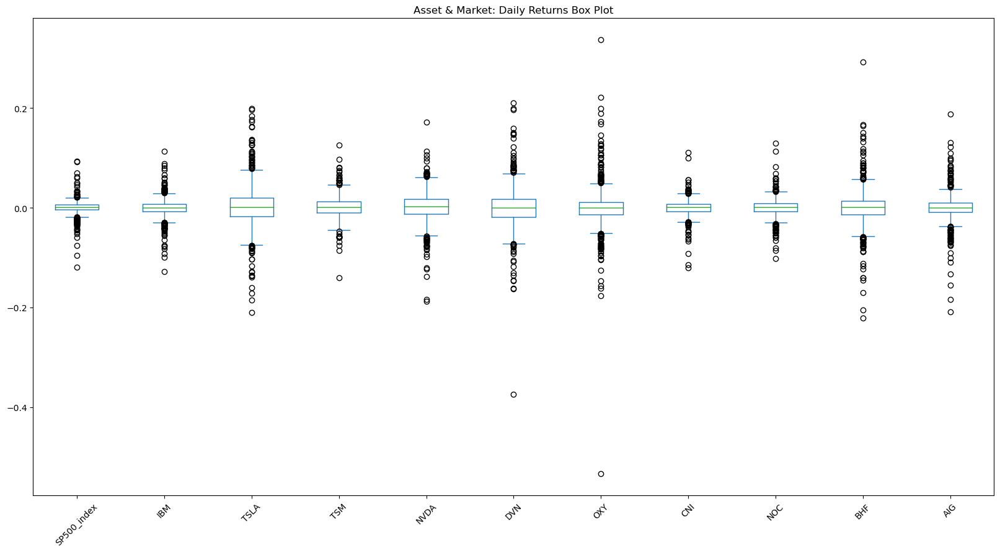

In [19]:
# Use the daily return data to create box plots to visualize the volatility of the assets 
asset_mkt_prices_returns_df.plot.box(
    figsize=(20, 10), 
    rot=45, 
    title = "Asset & Market: Daily Returns Box Plot"
)

In [20]:
# Sort the asset deviations
asset_mkt_prices_ann_std_sorted_df = asset_mkt_prices_ann_std_df.sort_values()

print("Asset annualized standard deviations (Sorted):")
display(asset_mkt_prices_ann_std_sorted_df)

Asset annualized standard deviations (Sorted):


SP500_index    0.212042
CNI            0.244932
NOC            0.281476
IBM            0.285434
TSM            0.333585
AIG            0.413054
NVDA           0.475904
BHF            0.551352
DVN            0.607367
OXY            0.633934
TSLA           0.647824
dtype: float64

In [21]:
# Dispaly the (sorted) asset sharpe ratios
print("Assets & Market: Annual Sharpe Ratio (Sorted):")
display(asset_prices_sharpe_ratio_df.sort_values())

asset_prices_sharpe_ratio_df.hvplot(
    kind = 'bar',
    width = 800,
    height = 500,
    hover_color = 'magenta',
    rot = 45,
    title = "Assets & Market: Annual Sharpe Ratio")

Assets & Market: Annual Sharpe Ratio (Sorted):


OXY            0.004722
IBM            0.087249
AIG            0.087326
BHF            0.103697
DVN            0.242085
CNI            0.424424
NOC            0.449401
SP500_index    0.760928
NVDA           0.963652
TSM            1.075931
TSLA           1.238226
dtype: float64

:Bars   [index]   (0)

In [22]:
# Drop the market from asset/mkt data frame
asset_prices_df = asset_mkt_prices_historical_df.drop(['SP500_index'], axis=1, inplace=False)
print("Asset Prices DataFrame (does not include market)")
display(asset_prices_df)

market_df = pd.DataFrame(asset_mkt_prices_returns_df['SP500_index'])

# Recompute frequence components (e.g. covariance matrix will be different).
asset_mkt_prices_returns_df,        \
asset_mkt_prices_ann_returns_mean,  \
asset_mkt_prices_std_df,            \
asset_mkt_prices_ann_std_df,        \
asset_mkt_prices_std_rolling_df,    \
asset_mkt_prices_ann_cov_mtrx_df,   \
asset_mkt_prices_ann_corr_mtrx_df,  \
asset_mkt_prices_cum_returns_df,    \
asset_prices_sharpe_ratio_df,       \
log_returns                           = qm.mpt_qa_compute_freq_stats(asset_prices_df)

Asset Prices DataFrame (does not include market)


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
Date,,,,,,,,,,
2015-10-22,137.753342,14.114667,22.510000,7.100000,44.750000,74.213623,61.610001,179.500000,NaN,60.750000
2015-10-23,138.317398,13.939333,22.469999,7.147500,44.959999,73.584694,61.779999,179.830002,NaN,61.279999
2015-10-26,137.342255,14.350667,22.160000,7.115000,42.790001,71.538177,62.119999,180.289993,NaN,61.160000
2015-10-27,131.797318,14.023333,22.200001,7.110000,41.200001,70.080658,59.810001,180.600006,NaN,60.919998
2015-10-28,134.636703,14.197333,22.080000,7.167500,41.560001,73.684525,62.009998,190.500000,NaN,63.889999
...,...,...,...,...,...,...,...,...,...,...
2021-05-21,138.374756,193.626663,111.849998,149.917496,25.350000,25.120001,104.290001,370.459991,48.680000,51.310001
2021-05-24,138.355637,202.146667,113.629997,156.119995,25.950001,25.440001,102.629997,372.179993,48.439999,51.880001
2021-05-25,137.466537,201.563339,114.279999,156.477493,25.799999,24.620001,105.389999,369.989990,46.750000,50.799999


In [23]:
print("Annual Covariance Matrix:")
display(asset_mkt_prices_ann_cov_mtrx_df.head())

print("Correlation Matrix:")
display(asset_mkt_prices_ann_corr_mtrx_df)

Annual Covariance Matrix:


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
IBM,0.081472,0.043651,0.042332,0.058027,0.074095,0.078436,0.038498,0.038813,0.094253,0.064887
TSLA,0.043651,0.419675,0.077798,0.130075,0.101970,0.083975,0.045021,0.012565,0.090108,0.068874
TSM,0.042332,0.077798,0.111279,0.097836,0.073695,0.068948,0.038959,0.023136,0.077506,0.048831
NVDA,0.058027,0.130075,0.097836,0.226485,0.094929,0.075133,0.052677,0.040540,0.103391,0.065482
DVN,0.074095,0.101970,0.073695,0.094929,0.368895,0.298389,0.075201,0.039988,0.194043,0.143655


Correlation Matrix:


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
IBM,1.000000,0.236064,0.444587,0.427172,0.427398,0.433479,0.550662,0.483094,0.598908,0.550360
TSLA,0.236064,1.000000,0.360002,0.421908,0.259158,0.204478,0.283737,0.068908,0.252278,0.257392
TSM,0.444587,0.360002,1.000000,0.616274,0.363729,0.326039,0.476823,0.246403,0.421405,0.354388
NVDA,0.427172,0.421908,0.616274,1.000000,0.328420,0.249039,0.451911,0.302637,0.394036,0.333117
DVN,0.427398,0.259158,0.363729,0.328420,1.000000,0.774974,0.505504,0.233903,0.579452,0.572616
OXY,0.433479,0.204478,0.326039,0.249039,0.774974,1.000000,0.468342,0.277072,0.567461,0.562609
CNI,0.550662,0.283737,0.476823,0.451911,0.505504,0.468342,1.000000,0.420856,0.588286,0.544804
NOC,0.483094,0.068908,0.246403,0.302637,0.233903,0.277072,0.420856,1.000000,0.399880,0.379238
BHF,0.598908,0.252278,0.421405,0.394036,0.579452,0.567461,0.588286,0.399880,1.000000,0.784837
AIG,0.550360,0.257392,0.354388,0.333117,0.572616,0.562609,0.544804,0.379238,0.784837,1.000000


[Text(0.5, 1.0, 'Asset Prices Correlation Matrix')]

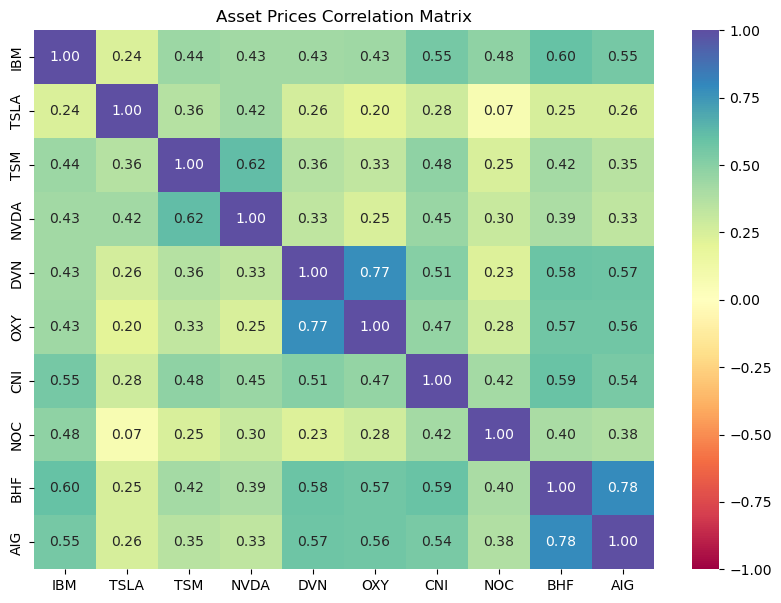

In [24]:
# Use the `heatmap` function from the seaborn library to visualize the correlation matrix
plt.figure(figsize = (10,7))
sns.heatmap(
    asset_mkt_prices_ann_corr_mtrx_df, 
    annot=True, 
    vmin=-1, 
    vmax=1, 
    fmt=".2f", 
    cmap="Spectral"
).set(
    title='Asset Prices Correlation Matrix')

In [25]:
print("Annual average asset returns:")
display(asset_mkt_prices_ann_returns_mean)

Annual average asset returns:


IBM     0.024904
TSLA    0.802152
TSM     0.358915
NVDA    0.458606
DVN     0.147034
OXY     0.002993
CNI     0.103955
NOC     0.126495
BHF     0.057173
AIG     0.036070
dtype: float64

___
### Efficient Frontier Computation

In [26]:
# Determine the efficient frontier components
efficient_frontier_df = qm.mpt_qa_get_efficient_frontier(asset_prices_df, asset_mkt_prices_ann_returns_mean, asset_mkt_prices_ann_cov_mtrx_df)

print("Efficient Frontier DataFrame:")
display(efficient_frontier_df.shape)

print("Print random 5 rows of Efficient Frontier sample points")
display(efficient_frontier_df.sample(5))

Efficient Frontier DataFrame:


(10000, 13)

Print random 5 rows of Efficient Frontier sample points


,Returns,Volatility,SharpeRatio,IBM_W,TSLA_W,TSM_W,NVDA_W,DVN_W,OXY_W,CNI_W,NOC_W,BHF_W,AIG_W
8681,0.235743,4.539355,0.045875,0.054864,0.113906,0.195755,0.066121,0.030146,0.098861,0.166149,0.098030,0.079080,0.097088
1089,0.238666,4.725120,0.044690,0.040457,0.123153,0.105681,0.089635,0.118846,0.108335,0.130005,0.188397,0.058969,0.036521
2410,0.211754,5.093684,0.036173,0.122067,0.136717,0.035713,0.106595,0.049017,0.104708,0.078585,0.066710,0.113580,0.186307
9082,0.145190,4.563108,0.025792,0.155454,0.018514,0.202225,0.034083,0.036457,0.084443,0.063885,0.108077,0.076832,0.220030
5245,0.241971,5.181789,0.041389,0.037707,0.130448,0.073572,0.144723,0.078721,0.105045,0.155531,0.033962,0.122965,0.117326


In [27]:
# Select the following portfolio allocations:
# (1) Based on the "minimum" risk
# (2) Based on the "maximum" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility, portfolio_max_volatility, portfolio_opt_sharpe_ratio = qm.mpt_qa_return_portfolio_allocations(efficient_frontier_df)

print("Efficient Frontier: Min Volatility Point:")
display(portfolio_min_volatility)
print("\nEfficient Frontier: Max Volatility Point:")
display(portfolio_max_volatility)
print("\nEfficient Frontier: Opt Sharpe Ratio Volatility Point:")
display(portfolio_opt_sharpe_ratio)

Efficient Frontier: Min Volatility Point:


Returns        0.177452
Volatility     3.785040
SharpeRatio    0.039617
IBM_W          0.174964
TSLA_W         0.085982
TSM_W          0.128262
NVDA_W         0.002190
DVN_W          0.027611
OXY_W          0.025084
CNI_W          0.217468
NOC_W          0.200119
BHF_W          0.001896
AIG_W          0.136425
Name: 3952, dtype: float64


Efficient Frontier: Max Volatility Point:


Returns        0.115086
Volatility     6.830366
SharpeRatio    0.012823
IBM_W          0.020310
TSLA_W         0.015722
TSM_W          0.017854
NVDA_W         0.045413
DVN_W          0.302996
OXY_W          0.090306
CNI_W          0.049292
NOC_W          0.019892
BHF_W          0.306374
AIG_W          0.131840
Name: 3146, dtype: float64


Efficient Frontier: Opt Sharpe Ratio Volatility Point:


Returns        0.368150
Volatility     4.882318
SharpeRatio    0.069772
IBM_W          0.041678
TSLA_W         0.226451
TSM_W          0.233916
NVDA_W         0.162152
DVN_W          0.029882
OXY_W          0.010021
CNI_W          0.113871
NOC_W          0.047574
BHF_W          0.000755
AIG_W          0.133702
Name: 803, dtype: float64

In [28]:
# Plot the efficient frontier #3 (Efficient frontier + porfolio selection points + 3rd color dimension of the sharpe ratio points)
scatter = hv.Scatter((efficient_frontier_df['Volatility'], efficient_frontier_df['Returns'], efficient_frontier_df.loc[:,'SharpeRatio']), 'Volatility', ['Return', 'Sharpe Ratio'])
max_sharpe = hv.Scatter([(portfolio_opt_sharpe_ratio[1],portfolio_opt_sharpe_ratio[0])])
min_volatility = hv.Scatter([(portfolio_min_volatility[1],portfolio_min_volatility[0])])
max_volatility = hv.Scatter([(portfolio_max_volatility[1],portfolio_max_volatility[0])])

scatter.opts(title="Efficient Frontier + Min/Max/Opt Sharpe Ratio Selections", color='Sharpe Ratio', cmap='plasma', width=800, height=600, colorbar=True, padding=0.1) *\
max_sharpe.opts(color='blue', line_color='black', size=15,) *\
min_volatility.opts(color='yellow', line_color='black', size=15) *\
max_volatility.opts(color='red', line_color='black', size=15)


:Overlay
   .Scatter.I   :Scatter   [Volatility]   (Return,Sharpe Ratio)
   .Scatter.II  :Scatter   [x]   (y)
   .Scatter.III :Scatter   [x]   (y)
   .Scatter.IV  :Scatter   [x]   (y)

### Visualization for: "mpt_performance_eval.py"

In [29]:
# Select the following portfolio allocations:
# (1) Based on the "minimum volatility" risk
# (2) Based on the "maximum returns" risk
# (3) Based on the "optimum sharpe ratio"
portfolio_min_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_min_volatility)
portfolio_max_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_max_volatility)
portfolio_opt_sharpe_ratio_volatility_returns_df = mpt.mpt_pe_compute_portfolio_returns(asset_mkt_prices_returns_df, portfolio_opt_sharpe_ratio)

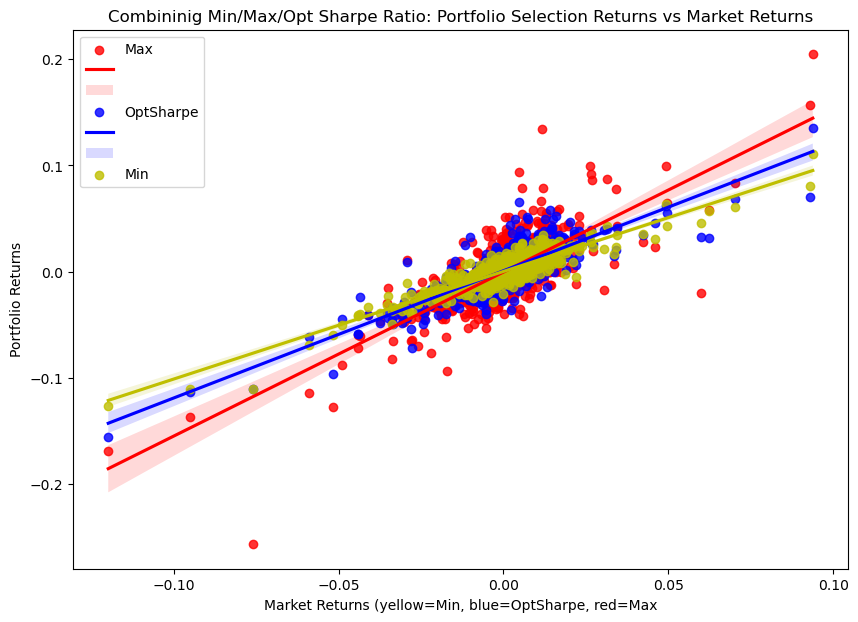

In [30]:
plt.subplots(figsize=(10,7))

x_df = market_df.reset_index(drop=True)
y_df = portfolio_max_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MaxVol"]
sns.regplot(x="Market", y="MaxVol", data=z_df, color='r')

y_df = portfolio_opt_sharpe_ratio_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "OptSharpe"]
sns.regplot(x="Market", y="OptSharpe", data=z_df, color='b')

y_df = portfolio_min_volatility_returns_df
z_df = pd.concat([x_df, y_df], axis=1, join="inner")
z_df.columns = ["Market", "MinReturns"]
sns.regplot(x="Market", y="MinReturns", data=z_df, color='y')

plt.xlabel("Market Returns (yellow=Min, blue=OptSharpe, red=Max")
plt.ylabel("Portfolio Returns")
plt.legend(["Max", "", "", "OptSharpe", "", "", "Min"])
plt.title("Combininig Min/Max/Opt Sharpe Ratio: Portfolio Selection Returns vs Market Returns")

plt.show()

<AxesSubplot:title={'center':'Portfolio Composition - Min Protfolio'}, ylabel='weights'>

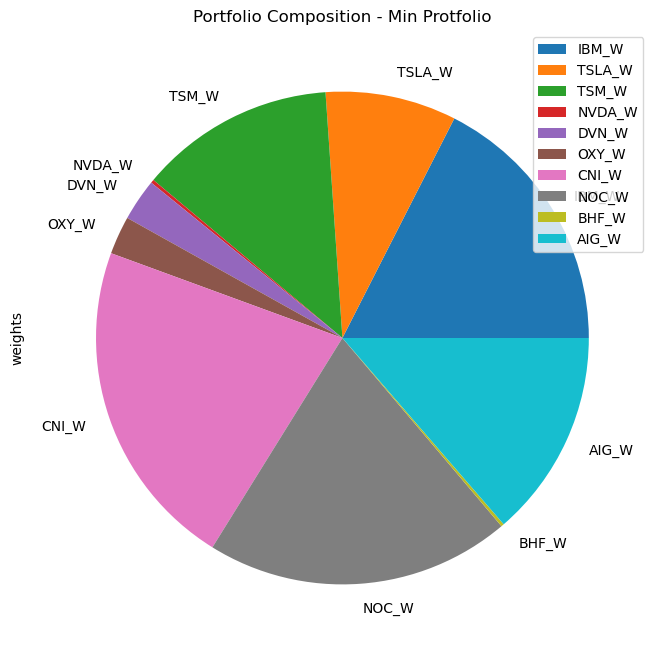

In [31]:
portfolio_min_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_min_volatility)

# Plot the pie charts of the porfolio allocation/weights
portfolio_min_weights.plot.pie(
    y='weights', 
    title='Portfolio Composition - Min Protfolio',
    figsize=(10,8))

<AxesSubplot:title={'center':'Portfolio Composition - Max Protfolio'}, ylabel='weights'>

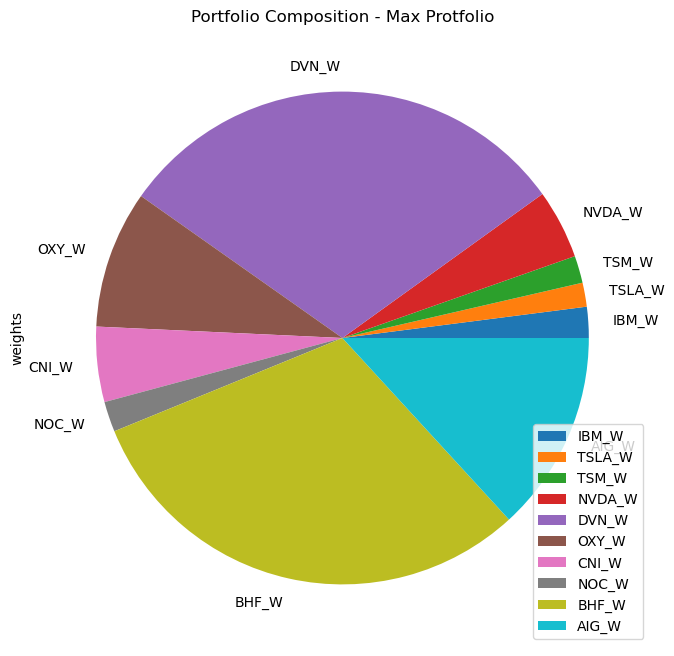

In [32]:
portfolio_max_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_max_volatility)

# Plot the pie charts of the porfolio allocation/weights
portfolio_max_weights.plot.pie(y='weights', title='Portfolio Composition - Max Protfolio', figsize=(10,8))

<AxesSubplot:title={'center':'Portfolio Composition - Opt Sharpe Ratio Protfolio'}, ylabel='weights'>

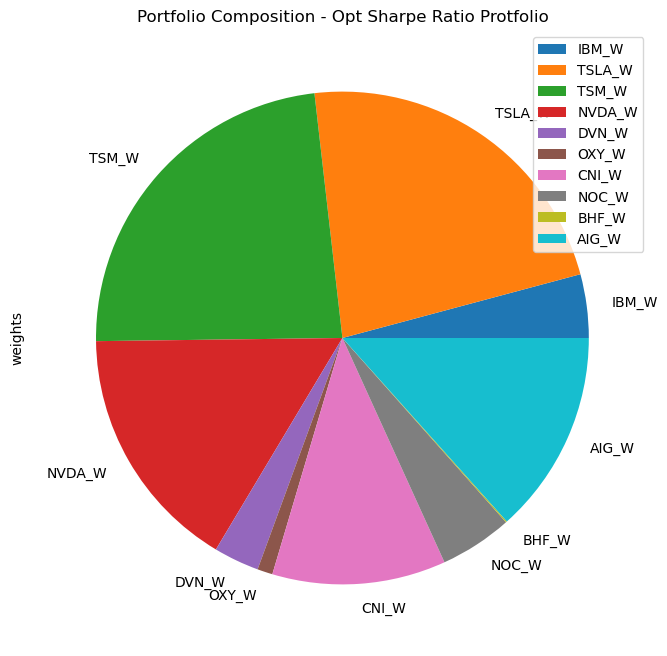

In [33]:
portfolio_opt_sharpe_ratio_weights = mpt.mpt_pe_get_portfolio_weights_df(portfolio_opt_sharpe_ratio)

# Plot the pie charts of the porfolio allocation/weights
portfolio_opt_sharpe_ratio_weights.plot.pie(y='weights', title='Portfolio Composition - Opt Sharpe Ratio Protfolio', figsize=(10,8))

### Compute Actual Realized Portfolio Value under the Test dataframe components

In [34]:
asset_prices_test_beg_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_historical_days_percent, :]).drop('SP500_index', axis=0, inplace=False)
asset_prices_test_end_df = pd.DataFrame(sql_basket_indexed_df.iloc[num_days_total-1, :]).drop('SP500_index', axis=0, inplace=False)

print("Beginning and end dates used for the testing the performance of the portfolio")
display(asset_prices_test_beg_df.T)
display(asset_prices_test_end_df.T)

Beginning and end dates used for the testing the performance of the portfolio


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
2021-06-01,137.848953,207.96666,118.510002,162.645004,30.200001,28.469999,112.129997,365.619995,49.360001,53.549999


,IBM,TSLA,TSM,NVDA,DVN,OXY,CNI,NOC,BHF,AIG
2022-10-21,129.929993,213.230698,63.355,124.300003,73.900002,71.089996,112.879997,523.940002,51.98,53.119999


___
### Monte-Carlo Dataframe Weights List

In [35]:
# Arrange Monte Carlo dataframe weights list
portfolio_mc_min_weights = mpt.mpt_pe_get_mc_weights(portfolio_min_weights)
portfolio_mc_max_weights = mpt.mpt_pe_get_mc_weights(portfolio_max_weights)
portfolio_mc_opt_sharpe_ratio_weights = mpt.mpt_pe_get_mc_weights(portfolio_opt_sharpe_ratio_weights)

In [36]:
investment_pnl_min = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_min_weights))[0][0]
investment_pnl_max = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_max_weights))[0][0]
investment_pnl_opt_sharpe_ratio = mpt.mpt_pe_compute_investment_pnl(mpt.initial_test_investment, asset_prices_test_beg_df, asset_prices_test_end_df, pd.DataFrame(portfolio_mc_opt_sharpe_ratio_weights))[0][0]

print("Actual realized portfolio value for min/max/opt_sharpe allocations:")
display(investment_pnl_min)
display(investment_pnl_max)
display(investment_pnl_opt_sharpe_ratio)

Actual realized portfolio value for min/max/opt_sharpe allocations:


10636.247604370117

16033.870670318604

9249.5276222229

### Run Monte-Carlo Simulations
---
* Compute expected Returns, and 
* Compare against realized returns

In [37]:
print("Number of MC runs:", mpt.num_mc_runs)

Number of MC runs: 500


In [38]:
# Slice the "test" dataframe to use for MC sims to predict returns
asset_mc_test_df = asset_mkt_prices_test_df.drop('SP500_index', axis=1, inplace=False)

In [39]:
# Arrange Monte-Carlo dataframe to have tuples for column names
asset_prices_mc_col_df = mpt.mpt_pe_get_mc_porfolio_df(asset_mc_test_df)

In [40]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the minimum risk portfolio weights
# Run 500 samples.
MC_min_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_min_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Min)")
MC_min_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Min)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [41]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (min)
MC_min_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.009356,0.998336,1.004486,0.995331,1.014818,0.991024,1.001981,1.005560,1.011990,0.994710,...,0.995354,0.994414,1.009330,1.004402,1.016188,0.996876,1.004274,1.009473,1.008649,1.010063
2,0.998314,0.998343,1.012894,1.000207,1.008615,1.002745,1.006703,1.000661,1.015808,0.998126,...,0.998972,0.983669,1.006939,1.009368,1.024373,0.995783,1.008706,1.009623,1.017996,0.996639
3,0.985713,0.999913,1.011772,1.006205,1.018373,0.998534,1.001182,0.994152,1.016824,0.990118,...,1.006452,0.971117,0.998248,1.014867,1.020089,1.005182,1.006726,1.006142,1.015016,0.988286
4,0.995947,0.998296,1.007444,1.004522,0.996761,1.004310,0.997274,0.993369,1.019514,0.991953,...,1.004697,0.978846,0.998590,1.025195,1.032044,1.011927,1.006868,0.999429,1.016305,0.992357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,1.111661,1.000340,1.149368,1.207203,1.015602,1.106561,1.033887,0.947392,1.226970,1.013198,...,1.300955,1.430435,1.068233,1.201612,1.030629,1.192227,1.118611,1.042254,0.888924,0.770354
350,1.114472,1.010127,1.136692,1.195348,1.020841,1.091181,1.033054,0.954470,1.228422,1.007694,...,1.300369,1.420632,1.057980,1.216096,1.037088,1.194243,1.124333,1.048217,0.886408,0.765905
351,1.108107,1.013248,1.129128,1.199060,1.017461,1.088707,1.026525,0.955752,1.231115,1.020760,...,1.298537,1.411182,1.053133,1.227103,1.044333,1.197178,1.129608,1.039541,0.882545,0.774561
352,1.113716,1.014148,1.122904,1.201079,1.022943,1.080679,1.026508,0.957386,1.255682,1.035931,...,1.299278,1.416141,1.055229,1.222310,1.038281,1.202655,1.130313,1.032897,0.893137,0.778834


In [42]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the maximum return risk-tolerant portfolio weights
# Run 500 samples.
MC_max_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_max_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Max)")
MC_max_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Max)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [43]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns (max)
MC_max_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.013165,0.992393,1.008083,1.032799,0.992302,1.020318,1.005654,0.985772,0.985177,0.993389,...,0.973672,1.006509,1.003780,0.996563,1.013348,1.000192,0.988801,0.992519,1.019305,1.015769
2,1.033858,0.977066,1.024995,1.035876,0.992394,1.030855,1.011780,0.990924,1.002433,1.012950,...,0.983846,1.003615,1.003797,1.019444,1.020301,1.002296,1.018622,0.983580,1.015145,1.024453
3,1.062415,0.984454,1.041700,1.060183,0.995705,1.046102,1.035534,1.001183,1.028306,1.006233,...,0.976938,0.983583,1.011583,1.023855,1.033033,1.003176,1.031191,0.987938,1.018260,1.001026
4,1.087539,0.987944,1.077069,1.073061,1.006470,1.033101,1.040262,0.974352,1.020551,1.003819,...,0.987075,0.985609,1.005758,1.007063,1.043290,1.005360,1.026891,0.987458,0.996063,0.990592
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,1.172361,2.189061,2.409812,1.543036,1.454173,1.209349,1.568553,1.683841,1.883287,1.722339,...,1.750523,1.260924,0.956646,1.201145,1.897384,1.763504,1.237402,1.652267,1.752295,1.402096
350,1.198819,2.231273,2.433684,1.535088,1.458688,1.212995,1.570451,1.711315,1.833078,1.686990,...,1.807665,1.249740,0.942307,1.187557,1.906737,1.757777,1.187960,1.651184,1.841441,1.391506
351,1.229160,2.199071,2.393681,1.541656,1.488894,1.194766,1.561726,1.749345,1.795785,1.704860,...,1.770506,1.230106,0.957733,1.189778,1.853912,1.765228,1.204618,1.655571,1.885805,1.402443
352,1.240984,2.165036,2.374270,1.501970,1.516090,1.213714,1.596874,1.746354,1.807037,1.658458,...,1.754043,1.260854,0.951278,1.181871,1.826080,1.770975,1.201593,1.674131,1.876935,1.406413


In [44]:
# Configure the Monte-Carlo simulation to forecast 1 year (20% of 5 years period)
# cumulative returns on the optimal risk-return Sharpe Ratio of the portfolio
# Run 500 samples.

MC_opt_sharpe_ratio_portfolio = MCSimulation(
    portfolio_data = asset_prices_mc_col_df,
    weights = portfolio_mc_opt_sharpe_ratio_weights,
    num_simulation = mpt.num_mc_runs,
    num_trading_days = num_test_days_percent
)

# Review the simulation input data
print("Monte Carlo Portfolio (Opt Sharpe)")
MC_opt_sharpe_ratio_portfolio.portfolio_data.tail()

Monte Carlo Portfolio (Opt Sharpe)


IBM                     TSLA                     TSM  \
                 close daily_return       close daily_return      close   
Date                                                                      
2022-10-14  120.040001    -0.014369  204.990005    -0.075456  63.919998   
2022-10-17  121.519997     0.012329  219.350006     0.070052  64.889999   
2022-10-18  122.940002     0.011685  220.190002     0.003829  63.709999   
2022-10-19  122.510002    -0.003498  222.039993     0.008402  63.660000   
2022-10-20  128.300003     0.047261  207.279999    -0.066474  63.580002   

                               NVDA                     DVN               \
           daily_return       close daily_return      close daily_return   
Date                                                                       
2022-10-14    -0.040528  112.269997    -0.061288  68.019997    -0.058547   
2022-10-17     0.015175  118.879997     0.058876  69.800003     0.026169   
2022-10-18    -0.018185  119.669998     0.006645  69.769997    -0.000430   
2022-10-19    -0.000785  120.510002     0.007019  71.940002     0.031102   
2022-10-20    -0.001257  121.940002     0.011866  71.680000    -0.003614   

                  OXY                      CNI                      NOC  \
                close daily_return       close daily_return       close   
Date                                                                      
2022-10-14  66.680000    -0.019412  107.029999    -0.025405  464.190002   
2022-10-17  67.360001     0.010198  111.150002     0.038494  475.089996   
2022-10-18  67.779999     0.006235  113.500000     0.021143  506.799988   
2022-10-19  68.459999     0.010032  112.910004    -0.005198  510.910004   
2022-10-20  68.849998     0.005697  109.680000    -0.028607  512.440002   

                               BHF                     AIG               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2022-10-14    -0.074286  48.630001    -0.006131  50.709999    -0.004515  
2022-10-17     0.023482  49.840000     0.024882  51.730000     0.020114  
2022-10-18     0.066745  51.419998     0.031701  52.599998     0.016818  
2022-10-19     0.008110  50.570000    -0.016531  52.750000     0.002852  
2022-10-20     0.002995  49.779999    -0.015622  51.849998    -0.017062

In [45]:
# Run the Monte Carlo simulation to forecast 1 year cumulative returns of the optimal (balanced) Sharpe Ratio
MC_opt_sharpe_ratio_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.995778,1.014819,0.980040,0.993620,0.990066,1.007509,1.011296,0.995761,0.996333,0.991235,...,1.001380,0.987464,0.987664,0.969954,0.995080,0.997031,0.987078,1.011210,0.986695,0.995155
2,1.011167,1.012613,0.973866,1.003269,0.989867,1.015633,1.034344,0.987781,0.979231,0.973927,...,0.996501,0.978208,1.010356,0.957251,0.979699,0.995743,0.975528,1.019618,0.977839,0.992505
3,1.012272,1.022812,0.986439,0.990061,1.002985,1.033986,1.024991,0.991217,0.989678,0.963228,...,1.021507,0.979420,1.026908,0.963613,0.970388,1.002064,0.982153,1.024387,0.985080,0.983753
4,1.028880,1.011826,0.984887,0.996192,1.016184,1.013574,1.025512,0.995914,0.983713,0.961493,...,1.020138,0.971945,1.022799,0.975949,0.961595,0.978194,0.964494,1.027105,0.983381,1.000322
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,1.080620,1.212372,1.316439,1.178910,0.707678,1.078949,0.936677,0.855334,0.853780,1.077236,...,1.111846,0.776678,1.580431,0.905183,0.632183,0.527319,1.024259,0.799787,0.794662,0.808750
350,1.088343,1.230928,1.331950,1.175370,0.709077,1.076492,0.951022,0.853928,0.850386,1.075392,...,1.099523,0.771071,1.576790,0.909287,0.632255,0.527497,1.033364,0.805100,0.788908,0.822356
351,1.085620,1.238578,1.333667,1.177143,0.710322,1.073902,0.955448,0.856598,0.845610,1.071056,...,1.082518,0.758698,1.568838,0.893019,0.637658,0.528091,1.025881,0.823417,0.792499,0.824267
352,1.084556,1.229790,1.298271,1.156638,0.716321,1.077888,0.954355,0.856942,0.842604,1.060103,...,1.096394,0.744610,1.580652,0.887850,0.637939,0.521979,1.026853,0.811980,0.790370,0.817358


### 4. Visualizations

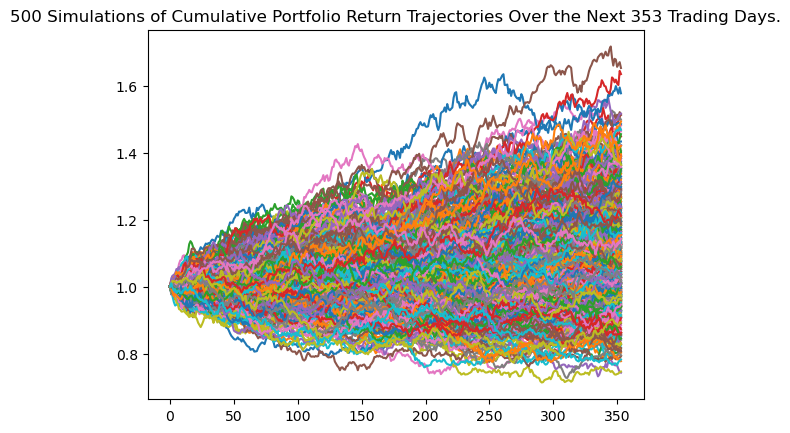

In [46]:
# Visualize the 1 year Monte Carlo simulation by creating an overlay line plot

line_plot_min_portfolio_plot = MC_min_portfolio.plot_simulation()

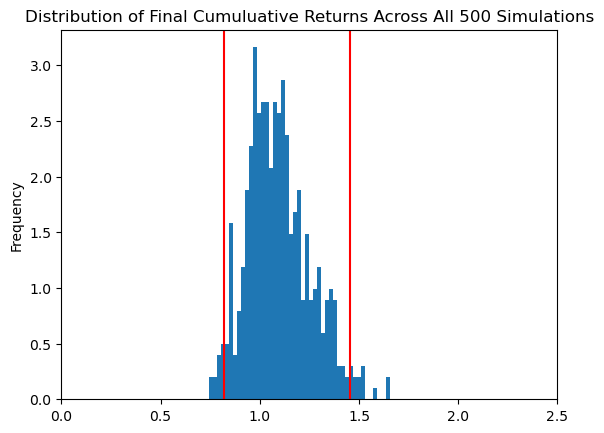

In [47]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_min_portfolio_plot = MC_min_portfolio.plot_distribution()

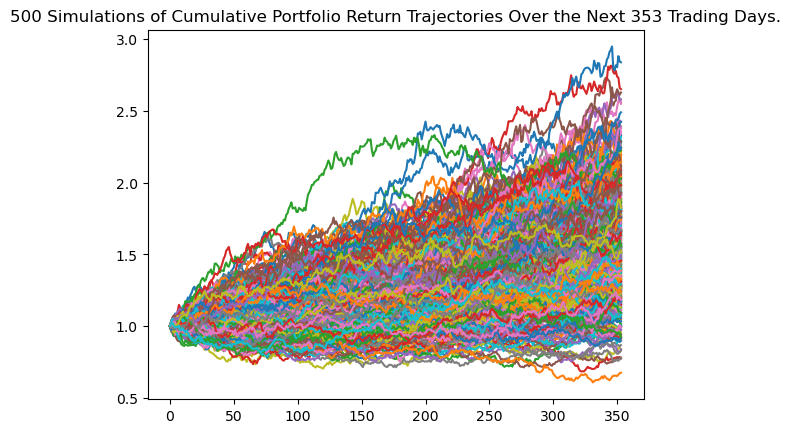

In [48]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_max_portfolio_plot = MC_max_portfolio.plot_simulation()

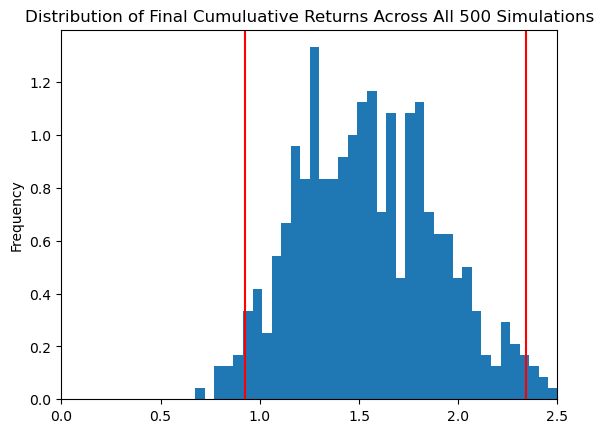

In [49]:
# Visualize the probability distribution of the 1 year Monte-Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_max_portfolio_plot = MC_max_portfolio.plot_distribution()

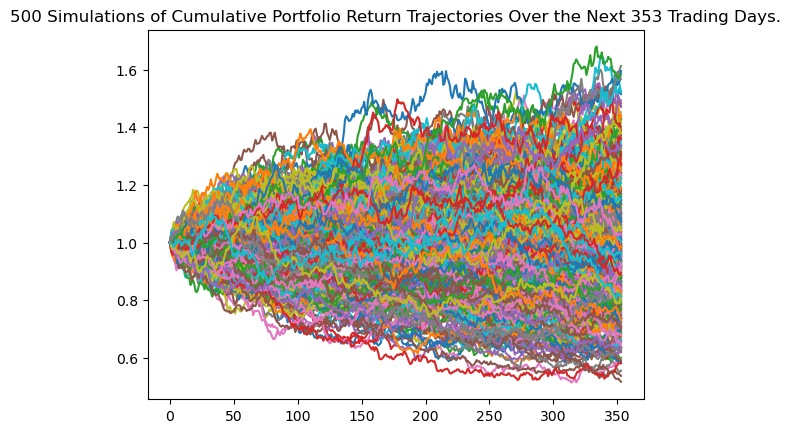

In [50]:
# Visualize the 1 year Monte Carlo simulation by creating an
# overlay line plot
line_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_simulation()

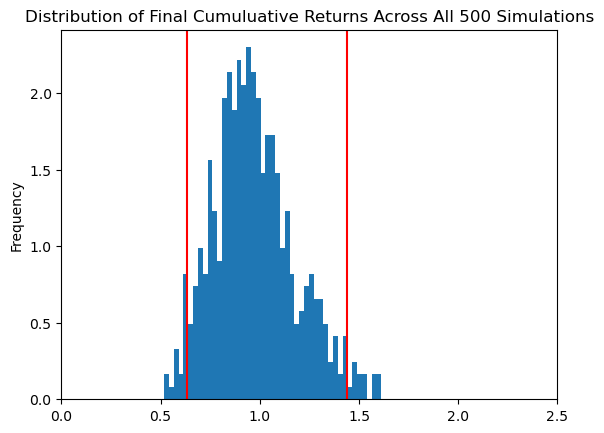

In [51]:
# Visualize the probability distribution of the 1 year Monte Carlo simulation 
# by plotting a histogram
plt.xlim([0, 2.5])
distribution_plot_opt_sharpe_ratio_portfolio_plot = MC_opt_sharpe_ratio_portfolio.plot_distribution()

In [52]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_min_portfolio_weight = MC_min_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_min_portfolio_weight)

count           500.000000
mean              1.095825
std               0.160840
min               0.742643
25%               0.982141
50%               1.078512
75%               1.193841
max               1.653945
95% CI Lower      0.820806
95% CI Upper      1.452669
Name: 353, dtype: float64


In [53]:
# Generate summary statistics from the 1 year Monte-Carlo simulation results
# Save the results as a variable
table_max_portfolio_weight = MC_max_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_max_portfolio_weight)

count           500.000000
mean              1.561988
std               0.370381
min               0.674994
25%               1.279576
50%               1.535647
75%               1.810061
max               2.838479
95% CI Lower      0.925317
95% CI Upper      2.343978
Name: 353, dtype: float64


In [54]:
# Generate summary statistics from the 1 year Monte Carlo simulation results
# Save the results as a variable
table_opt_sharpe_ratio_portfolio_weight = MC_opt_sharpe_ratio_portfolio.summarize_cumulative_return()

# Review the 1 year Monte Carlo summary statistics
print(table_opt_sharpe_ratio_portfolio_weight)

count           500.000000
mean              0.974684
std               0.207277
min               0.517536
25%               0.833909
50%               0.952020
75%               1.091967
max               1.612761
95% CI Lower      0.631613
95% CI Upper      1.439865
Name: 353, dtype: float64


In [55]:
# Print the initial investment in the portfolio
print(f"The initial investment of the portfolio is ${mpt.initial_test_investment:0.2f}")

The initial investment of the portfolio is $10000.00


In [56]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MIN portfolio

# Get the lower and upper CI values
ci_lower_95per = table_min_portfolio_weight[8]
ci_upper_95per = table_min_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2)

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current minimum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_min:0.2f}")


There is a 95% chance that the current minimum portfolio value of $10000.00, will end within the range of $8208.06 and $14526.69.
The actual realized value of the portfolio was $10636.25


In [57]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the MAX portfolio

# Get the lower and upper CI values
ci_lower_95per = table_max_portfolio_weight[8]
ci_upper_95per = table_max_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltiver returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2)
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current maximum portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_max:0.2f}")


There is a 95% chance that the current maximum portfolio value of $10000.00, will end within the range of $9253.17 and $23439.78.
The actual realized value of the portfolio was $16033.87


In [58]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes for the OPT SHARPE RATIO portfolio

# Get the lower and upper CI values
ci_lower_95per = table_opt_sharpe_ratio_portfolio_weight[8]
ci_upper_95per = table_opt_sharpe_ratio_portfolio_weight[9]

# Determine the lower and upper bounds of the expected cumaltive returns
ci_lower_cumulative_return = round(ci_lower_95per * mpt.initial_test_investment, 2) 
ci_upper_cumulative_return = round(ci_upper_95per * mpt.initial_test_investment, 2) 

# Print the result of your calculations
print()
print(f"There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of ${mpt.initial_test_investment:0.2f}, will end within the range of"
      f" ${ci_lower_cumulative_return:0.2f} and ${ci_upper_cumulative_return:0.2f}.")
print(f"The actual realized value of the portfolio was ${investment_pnl_opt_sharpe_ratio:0.2f}")


There is a 95% chance that the current optimal Sharpe Ratio of a given portfolio value of $10000.00, will end within the range of $6316.13 and $14398.65.
The actual realized value of the portfolio was $9249.53
